# Simulation of tornado dynamics and their impact on building structures using Navier-Stokes equations

This exercise examines the dynamic behaviour of tornadoes and their impact on building structures by solving the two-dimensional incompressible Navier-Stokes equations. The study is crucial for understanding how the intense, swirling winds of a tornado affect the structural integrity of buildings. The analysis involves numerically solving the Navier-Stokes equations to simulate the time-dependent wind velocity and pressure distribution around the structure. The wind field is modelled as a swirling vortex, and the building is represented as a rectangular obstacle. This approach allows for the identification of regions of high velocity and pressure, assessing the risks associated with structural stress and potential damage.


## Problem formulation

To rigorously evaluate the dynamic behaviour of tornadoes and their impact on building structures, a mathematical model is developed based on the principles of fluid dynamics. Tornadoes induce significant wind forces that can cause structural damage. This study employs numerical methods to solve the two-dimensional incompressible Navier-Stokes equations, capturing the time-dependent wind velocity and pressure distribution around a building structure.

### Governing equations

For the two-dimensional incompressible flow, the dynamics are governed by the following equations.

1. **Continuity equation**

    To enforce mass conservation for an incompressible fluid, the continuity equation is given by:

    $$
    \nabla \cdot \mathbf{u} = \frac{\partial u}{\partial x} + \frac{\partial v}{\partial y} = 0
    $$

    with the velocity vector defined as:

    $$
    \mathbf{u}(x,y,t) = \begin{bmatrix} u(x,y,t) \\ v(x,y,t) \end{bmatrix},
    $$

    where $u(x,y,t)$ and $v(x,y,t)$ are the velocity components in the $x$ and $y$ directions, respectively.

2. **Momentum equations**
   
    The momentum equations describe the evolution of the velocity field due to advection, pressure gradients, and viscous effects. In vector form, they are expressed as:

    $$
    \frac{\partial \mathbf{u}}{\partial t} + (\mathbf{u}\cdot\nabla)\mathbf{u} = -\frac{1}{\rho}\nabla p + \nu \nabla^2 \mathbf{u} + \mathbf{F}_{tornado}
    $$

    which, when written in component form, yield:

    - $x$-momentum equation:

    $$
    \frac{\partial u}{\partial t} + u\,\frac{\partial u}{\partial x} + v\,\frac{\partial u}{\partial y} = -\frac{1}{\rho}\frac{\partial p}{\partial x} + \nu\left(\frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2}\right) + F_x
    $$

    - $y$-momentum equation:

    $$
    \frac{\partial v}{\partial t} + u\,\frac{\partial v}{\partial x} + v\,\frac{\partial v}{\partial y} = -\frac{1}{\rho}\frac{\partial p}{\partial y} + \nu\left(\frac{\partial^2 v}{\partial x^2} + \frac{\partial^2 v}{\partial y^2}\right) + F_y
    $$

    where:

    - $p(x,y,t)$ is the pressure field,
    - $\rho$ is the (constant) fluid density,
    - $\nu$ is the kinematic viscosity,
    - $\mathbf{F}_{tornado} = \left(F_x,F_y\right)$ represents the tornado-induced forces.
  
3. **Pressure Poisson equation**

    To maintain the divergence-free (incompressible) nature of the velocity field during time advancement, the pressure field is updated by solving a Poisson equation derived by taking the divergence of the momentum equations and applying the continuity constraint. The pressure Poisson equation is:

    $$
    \nabla^2 p = \rho \left( \frac{1}{\Delta t}\left(\frac{\partial u}{\partial x} + \frac{\partial v}{\partial y}\right) - \left(\frac{\partial u}{\partial x}\right)^2 - 2 \frac{\partial u}{\partial y}\frac{\partial v}{\partial x} - \left(\frac{\partial v}{\partial y}\right)^2 \right)
    $$

    with the Laplacian defined as:

    $$
    \nabla^2 p = \frac{\partial^2 p}{\partial x^2} + \frac{\partial^2 p}{\partial y^2}.
    $$

4. **Tornado movement model**

    To simulate a moving tornado, its centre at time $t$ is defined as $(x_t(t), y_t(t))$, progressing with velocity $(v_x, v_y)$:

    $$
    x_t(t) = x_{t,0} + v_x t, \quad y_t(t) = y_{t,0} + v_y t.
    $$

    The tornado is modelled as a Rankine vortex:

    $$
    u_{\theta}(r) = \dfrac{\Gamma}{2\pi}
    \begin{cases}
        r/r_c^2, & r \leq r_c, \quad \text{(solid-body rotation)} \\
        1/r, & r > r_c, \quad \text{(potential vortex)}
    \end{cases}
    $$

    where:
    - $r = \sqrt{(x - x_t)^2 + (y - y_t)^2}$ is the distance from the tornado centre,
    - $\Gamma$ is the circulation strength,
    - $r_c$ is the tornado core radius.

    The velocity components in Cartesian coordinates are given as:

    $$
    u_{\text{tornado}} = -u_{\theta} \sin \theta, \quad v_{\text{tornado}} = u_{\theta} \cos \theta.
    $$

    Thus, the forcing terms in the Navier-Stokes equations are:

    $$
    F_x = -u_{\theta} \sin \theta, \quad F_y = u_{\theta} \cos \theta.
    $$

### Initial and boundary conditions

The problem is solved under the following initial and boundary conditions:

1. **Initial conditions**

   The initial velocity field is set to emulate a swirling vortex—mimicking a tornado—centred at $(x_c, y_c)$:

   $$
   \begin{cases}
   \mathbf{u}(x, y, 0) = -v_0 \left( \dfrac{y - y_c}{r} \right) \exp \left( -\dfrac{r^2}{2 R^2} \right) \\
   \mathbf{v}(x, y, 0) = v_0 \left( \dfrac{x - x_c}{r} \right) \exp \left( -\dfrac{r^2}{2 R^2} \right) \\
   \end{cases}
   $$

   where $r = \sqrt{(x - x_c)^2 + (y - y_c)^2}$ is the radial distance from the tornado centre, $v_0$ is the maximum tangential velocity, and $R$ is the characteristic radius of the tornado.

   The initial pressure field $\mathbf{p}(x, y, 0)$ is assumed to be uniform.

2. **Boundary conditions**
   
    - **Inflow boundary**
    At the inflow boundaries, the incoming wind field is specified by means of a Dirichlet boundary condition, meaning that a predefined wind velocity profile representing the tornado is applied:
    $$
    \begin{cases}
    \mathbf{u}(x, y, t) = \mathbf{u}_{in}(y, t) \\
    \mathbf{v}(x, y, t) = \mathbf{v}_{in}(y, t) \\
    \end{cases}
    $$
   
    - **Outflow boundary**
    At the outflow boundary ($x=L$), a common approach is to apply Neumann boundary conditions (i.e. a zero-gradient condition) for the velocity components, while for the pressure a reference condition is imposed (typically zero gauge pressure):
    $$
    \begin{cases}
    \dfrac{\partial \mathbf{u}}{\partial x}(L,y,t) = \mathbf{0} \\
    p(L,y,t) = 0 \\
    \end{cases}
    $$
   
    - **Solid boundaries (building surfaces)**
    A no-slip condition is enforced, ensuring that the fluid velocity is equal to the velocity of the solid surface (typically zero for a stationary structure):
    $$
    \mathbf{u} = \mathbf{0} \quad \text{on solid boundaries}.
    $$
   
    - **Far-field boundaries**
    At the far-field boundaries, a free-stream condition (Dirichlet condition) is applied, where the velocity and pressure are assumed to be undisturbed by the tornado:
    $$
    \mathbf{u} = \mathbf{u}_\infty, \quad p = p_\infty,
    $$
    where $\mathbf{u}_\infty$ and $p_\infty$ represent the ambient (free-stream) velocity and pressure, respectively.

### Definition of obstacles

The building structure is modelled as a rectangular obstacle within the domain. The obstacle is defined by its geometric dimensions and location within the simulation domain. Mathematically, the building is represented as:

$$
\text{Building Region} = \{(x, y) \big| x_1 \leq x \leq x_2, y_1 \leq y \leq y_2\}
$$

where $(x_1, y_1)$ and $(x_2, y_2)$ are the coordinates of the bottom-left and top-right corners of the building, respectively. The presence of the obstacle affects the flow field, creating regions of high velocity and pressure.

### Numerical discretisation

The Navier-Stokes equations are solved using the finite difference method (FDM). The spatial domain is divided into a grid with uniform spacing in both the $x$- and $y$-directions. The time domain is discretised with a step size $\Delta t$. However, the approach pursued in this exercise leverages `np.gradient` from the NumPy library, making it more efficient and easier to handle the calculation of derivatives in the spatial domain.

#### Spatial discretisation

The spatial derivatives are approximated using central differences:

$$
\frac{\partial \mathbf{u}}{\partial x} \approx \frac{\mathbf{u}_{i+1,j} - \mathbf{u}_{i-1,j}}{2\Delta x}, \quad
\frac{\partial \mathbf{u}}{\partial y} \approx \frac{\mathbf{u}_{i,j+1} - \mathbf{u}_{i,j-1}}{2\Delta y}
$$

$$
\frac{\partial^2 \mathbf{u}}{\partial x^2} \approx \frac{\mathbf{u}_{i+1,j} - 2\mathbf{u}_{i,j} + \mathbf{u}_{i-1,j}}{\Delta x^2}, \quad
\frac{\partial^2 \mathbf{u}}{\partial y^2} \approx \frac{\mathbf{u}_{i,j+1} - 2\mathbf{u}_{i,j} + \mathbf{u}_{i,j-1}}{\Delta y^2}
$$

#### Temporal discretisation

The time derivatives are approximated using the forward Euler method:

$$
\frac{\partial \mathbf{u}}{\partial t} \bigg|_{(i,j)} \approx \frac{\mathbf{u}_{i,j}^{n+1} - \mathbf{u}_{i,j}^n}{\Delta t}
$$

where $\mathbf{u}_{i,j}^n$ denotes the velocity component at position $(i, j)$ and time $n$.

#### Fully discretised equations

The discretised form of the Navier-Stokes equations becomes:

\begin{align*}
\mathbf{u}_{i,j}^{n+1} &= \mathbf{u}_{i,j}^n - \Delta t \left( \mathbf{u}_{i,j}^n \frac{\mathbf{u}_{i+1,j}^n - \mathbf{u}_{i-1,j}^n}{2\Delta x} + \mathbf{v}_{i,j}^n \frac{\mathbf{u}_{i,j+1}^n - \mathbf{u}_{i,j-1}^n}{2\Delta y} \right) \\
& + \Delta t \left( \nu \left( \frac{\mathbf{u}_{i+1,j}^n - 2\mathbf{u}_{i,j}^n + \mathbf{u}_{i-1,j}^n}{\Delta x^2} + \frac{\mathbf{u}_{i,j+1}^n - 2\mathbf{u}_{i,j}^n + \mathbf{u}_{i,j-1}^n}{\Delta y^2} \right) \right) \\
& - \Delta t \frac{1}{\rho} \left( \frac{\mathbf{p}_{i+1,j}^n - \mathbf{p}_{i-1,j}^n}{2\Delta x} \right) + \Delta t \left( F_x^{n} + F_y^{n} \right)
\end{align*}

#### Stability criterion

To ensure stability in the numerical method, the following criterion must be satisfied:

$$
\Delta t \leq \frac{1}{2} \min\left( \frac{\Delta x^2}{\nu}, \frac{\Delta y^2}{\nu} \right)
$$

This condition limits the time step to avoid instability in the numerical solution.

### Model assumptions

1. The domain is a two-dimensional, homogeneous, and isotropic material.
2. The tornado wind field is represented using the incompressible Navier-Stokes equations.
3. Boundary conditions account for wind interactions with the building and the surrounding environment.
4. The material properties of the air and the building structure remain constant throughout the analysis.


## Implementation

The implementation involves numerically solving the incompressible Navier-Stokes equations using the finite difference method (FDM). This method discretises both space and time, and the solution is iteratively computed across the grid for each time step.

### Parameter definition

The physical and numerical parameters, including domain dimensions, and simulation parameters are defined as follows.

In [1]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

%matplotlib widget

# Domain parameters
Lx, Ly = 2200, 2200  # Domain size (m) in x and y directions
Nx, Ny = 151, 151  # Number of grid points
dx = Lx / (Nx - 1)  # Spatial step size in x direction (m)
dy = Ly / (Ny - 1)  # Spatial step size in y direction (m)

# Fluid properties (air)
rho = 1.225  # Density (kg/m^3)
nu = 1.562e-5  # Kinematic viscosity (m^2/s)

# Far-field conditions (ambient flow)
u_inf = 2.0  # Free-stream velocity in x direction (m/s)
v_inf = 0.0  # Free-stream velocity in y direction (m/s)
p_inf = 101325  # Free-stream pressure (Pa)

# Tornado parameters
Gamma = 1.5e3  # Circulation strength (m^2/s)
r_c = 80  # Core radius (m) (typical tornado core radius)
R = 100  # Characteristic radius (m)
v_0 = 30  # Maximum tangential velocity (m/s)
v_tx, v_ty = 15.0, 12.0  # Tornado translation velocity (m/s)
x_c, y_c = Lx / 3, Ly / 2  # Coordinates of the centre (m)

# Time step and simulation time
dt = 1e-2  # Time step (s)
t_max = 45  # Maximum simulation time (s)
steps = int(t_max / dt)

# Create meshgrid for X and Y coordinates
x = np.linspace(0, Lx, Nx)
y = np.linspace(0, Ly, Ny)
X, Y = np.meshgrid(x, y)

### Initialisation of the flow field and building geometry

A swirling vortex is established to emulate the tornado’s initial state.

In [2]:
# Initial conditions for velocity and pressure fields
u = np.zeros((Ny, Nx))  # Initial x-velocity array
v = np.zeros((Ny, Nx))  # Initial y-velocity array
p = np.full((Ny, Nx), p_inf)  # Initial pressure array

# Compute radial distance avoiding singularity at the centre
epsilon = 1e-10
r = np.sqrt((X - x_c) ** 2 + (Y - y_c) ** 2) + epsilon

# Initial swirling vortex velocity field
u = -v_0 * (Y - y_c) / r * np.exp(-(r**2) / (2 * R**2))
v = v_0 * (X - x_c) / r * np.exp(-(r**2) / (2 * R**2))

Additionally, a rectangular building is defined as a solid obstacle, where the no-slip condition is enforced.

In [3]:
# Define the building geometry as a rectangular obstacle (in metres)
building = np.zeros((Ny, Nx), dtype=bool)

# A building located between (x1,y1) and (x2,y2)
x1, x2 = 1400, 1600
y1, y2 = 1300, 1500
building[(X >= x1) & (X <= x2) & (Y >= y1) & (Y <= y2)] = True

### Application of boundary conditions

A dedicated function is implemented to enforce the boundary conditions on the velocity and pressure fields. These conditions include a fixed inflow profile, a zero-gradient condition at the outflow, free-stream conditions at the top and bottom boundaries, and the no‐slip condition on the building.

In [4]:
def velocity_boundary_conditions(u, v, u_inf, v_inf, building):
    """
    Enforce the boundary conditions on the velocity field.

    Parameters:
    -----------
    u : 2D numpy array
        x-component of the velocity field.
    v : 2D numpy array
        y-component of the velocity field.
    u_inf : float
        Free-stream velocity in x direction.
    v_inf : float
        Free-stream velocity in y direction.
    building : 2D boolean array
        Mask indicating the location of the building.

    Returns:
    --------
    u, v : Updated velocity field.
    """
    # Inflow (left boundary): prescribed free-stream velocity
    u[:, 0] = u_inf
    v[:, 0] = v_inf

    # Outflow (right boundary): zero-gradient for velocity
    u[:, -1] = u[:, -2]
    v[:, -1] = v[:, -2]

    # Top and bottom: free-stream conditions
    u[0, :] = u_inf
    u[-1, :] = u_inf
    v[0, :] = v_inf
    v[-1, :] = v_inf

    # Building: enforce no-slip inside the building region
    u[building] = 0.0
    v[building] = 0.0

    return u, v


def pressure_boundary_conditions(p, p_inf):
    """
    Enforce the boundary conditions on the pressure field.

    Parameters:
    -----------
    p : 2D numpy array
        Pressure field.
    p_inf : float
        Free-stream pressure.

    Returns:
    --------
    p : Updated pressure field.
    """
    # Inflow (left boundary): Neumann condition (dp/dx = 0)
    p[:, 0] = p_inf

    # Outflow (right boundary):  Dirichlet (p = p_inf)
    p[:, -1] = p[:, -2]

    # Bottom boundary: Neumann condition (dp/dy = 0)
    p[:, 0] = p[:, 1]

    # Top boundary: Neumann condition (dp/dy = 0)
    p[-1, :] = p[-2, :]

    return p

### Rankine vortex model

The tornado is modelled as a moving Rankine vortex. The function computes the forcing terms to be applied to the momentum equations, based on the vortex‐induced tangential velocity.

In [5]:
def tornado_forcing(X, Y, x_t, y_t, Gamma, r_c, epsilon=1e-8):
    """
    Compute the forcing terms (F_x, F_y) based on a Rankine vortex model.

    Parameters:
    -----------
    X : 2D array of floats
        Meshgrid of x-coordinates
    Y : 2D array of floats
        Meshgrid of y-coordinates
    x_t : float
        x-coordinate of the tornado centre
    y_t : float
        y-coordinate of the tornado centre
    Gamma : float
        Circulation strength of the tornado
    r_c : float
        Core radius of the tornado
    epsilon : float (default: 1e-10)
        Small value to avoid singularity at the tornado centre

    Returns:
    --------
    F_x : 2D array of floats
        Forcing term in the x-direction
    F_y : 2D array of floats
        Forcing term in the y-direction
    """
    dx_t = X - x_t
    dy_t = Y - y_t

    # Calculate the relative distance and angle from the tornado centre
    r = np.sqrt(dx_t**2 + dy_t**2) + epsilon
    theta = np.arctan2(dy_t, dx_t)

    # Rankine vortex model: solid-body rotation inside core, potential vortex outside
    u_theta = np.where(
        r <= r_c, (Gamma / (2 * np.pi * r_c)) * (r / r_c), Gamma / (2 * np.pi * r)
    )

    # Convert the polar components into Cartesian forcing terms
    F_x = -u_theta * np.sin(theta)
    F_y = u_theta * np.cos(theta)

    return F_x, F_y

### Pressure Poisson solver

To enforce the incompressibility condition, the pressure field is updated by solving the pressure Poisson equation iteratively. The solver employs finite-difference approximations, eventually applying pressure boundary conditions. These conditions enforce a zero-gradient (Neumann) condition on the domain boundaries.

#### 1. Compute the pressure source term

The source term in the Poisson equation is computed as follows:
$$
\rho \left( \frac{1}{\Delta t}\left(\frac{\partial u}{\partial x} + \frac{\partial v}{\partial y}\right) - \left(\frac{\partial u}{\partial x}\right)^2 - 2 \frac{\partial u}{\partial y}\frac{\partial v}{\partial x} - \left(\frac{\partial v}{\partial y}\right)^2 \right)
$$

In [6]:
def pressure_source(u, v, dx, dy, rho, dt):
    """
    Compute the right-hand side of the Poisson equation.

    Parameters:
    -----------
    u : 2D numpy array
        x-component of the velocity field.
    v : 2D numpy array
        y-component of the velocity field.
    dx, dy : float
        Grid spacings.
    rho : float
        Fluid density.
    dt : float
        Time step size.

    Returns:
    --------
    source : 2D numpy array
        Right-hand side of the Poisson equation.
    """
    # Compute the derivatives using np.roll (central differences)
    dudy, dudx = np.gradient(u, dy, dx)
    dvdy, dvdx = np.gradient(v, dy, dx)

    # Compute the source term
    source = rho * ((1 / dt) * (dudx + dvdy) - dudx**2 - 2 * dudy * dvdx - dvdy**2)

    return source

#### 2. Pressure update

The pressure field is updated using the finite difference discretisation of the Poisson equation. The function computes the new pressure values for the interior points by averaging the four neighbouring values and subtracting the source term scaled by $h^2$ (with $h=dx=dy$):
$$
p^{\text{new}}_{i,j} = \frac{p_{i+1,j} + p_{i-1,j} + p_{i,j+1} + p_{i,j-1} - h^2 \cdot \text{source}_{i,j}}{4}
$$

In [7]:
def pressure_update(p, source, h):
    """
    Update the pressure field using a vectorised Jacobi iteration.

    Parameters:
    -----------
    p : 2D numpy array
        Pressure field.
    source : 2D numpy array
        Right-hand side of the Poisson equation.
    h : float
        Grid spacing (h = dx = dy).
    tol : float
        Tolerance for convergence.
    max_iter : int
        Maximum number of iterations.

    Returns:
    --------
    p : 2D numpy array
        Updated pressure field.
    """
    # Update pressure field using the Poisson equation
    p_new = (
        np.roll(p, 1, axis=0)
        + np.roll(p, -1, axis=0)
        + np.roll(p, 1, axis=1)
        + np.roll(p, -1, axis=1)
        - h**2 * source
    ) / 4.0

    return p_new

#### 3. Solve the pressure Poisson equation using Jacobi method

The Poisson equation is solved using the Jacobi method, which updates the pressure field at each grid point simultaneously, using only the previous iteration's values for neighbouring points.

In [8]:
def solve_poisson_eqn(p, u, v, p_inf, dx, dy, rho, dt, tol=1e-3, max_iter=50):
    """
    Solve the pressure Poisson equation using the Jacobi method.

    Parameters:
    -----------
    p : 2D numpy array
        Pressure field.
    u : 2D numpy array
        x-component of the velocity field.
    v : 2D numpy array
        y-component of the velocity field.
    dx, dy : float
        Grid spacings.
    rho : float
        Fluid density.
    dt : float
        Time step size.
    tol : float
        Tolerance for convergence.
    max_iter : int
        Maximum number of iterations.

    Returns:
    --------
    p : 2D numpy array
        Updated pressure field.
    """
    # Compute the right-hand side of the Poisson equation
    source = pressure_source(u, v, dx, dy, rho, dt)

    # Solve the Poisson equation
    for _ in range(max_iter):
        # Store previous pressure field for convergence check
        p_old = p.copy()

        # Update the pressure field
        p = pressure_update(p, source, dx)

        # Apply boundary conditions
        p = pressure_boundary_conditions(p, p_inf)

        # Check for convergence
        if np.linalg.norm(p - p_old, np.inf) < tol:
            break

        # If divergence is detected, break early
        if np.isnan(p).any() or np.isinf(p).any():
            break

    return p

### Velocity update

The velocity field is updated using the forward Euler time integration and central difference spatial approximations. This modular function takes the current velocity and pressure fields along with the forcing terms and returns the updated velocities, which are calculated considering the momentum equation:
$$
\frac{\partial \mathbf{u}}{\partial t} + (\mathbf{u}\cdot\nabla)\mathbf{u} = -\frac{1}{\rho}\nabla p + \nu \nabla^2 \mathbf{u} + \mathbf{F}_{tornado}
$$

In [9]:
def update_velocity_field(u, v, p, dt, dx, dy, rho, nu, F_x, F_y):
    """
    Update the velocity field using forward Euler in time and central differences in space.

    Parameters:
    -----------
    u, v : 2D arrays
        Velocity fields to update.
    p : 2D array
        Pressure field.
    u_prev, v_prev : 2D arrays
        Previous time step velocity fields.
    dt : float
        Time step size.
    dx, dy : float
        Grid spacings.
    rho : float
        Fluid density.
    nu : float
        Kinematic viscosity.
    F_x, F_y : 2D arrays
        Forcing terms in the x and y directions.

    Returns:
    --------
    u, v : 2D arrays
        Updated velocity fields.
    """
    # Compute spatial gradients using central differences
    du_dx = np.gradient(u, dx, axis=1)
    du_dy = np.gradient(u, dy, axis=0)
    dv_dx = np.gradient(v, dx, axis=1)
    dv_dy = np.gradient(v, dy, axis=0)

    # Compute Laplacians using central differences
    d2u_dx2 = np.gradient(du_dx, dx, axis=1)
    d2u_dy2 = np.gradient(du_dy, dy, axis=0)
    d2v_dx2 = np.gradient(dv_dx, dx, axis=1)
    d2v_dy2 = np.gradient(dv_dy, dy, axis=0)

    # Compute pressure gradients using central differences
    dp_dx = np.gradient(p, dx, axis=1)
    dp_dy = np.gradient(p, dy, axis=0)

    # Compute time derivatives from the momentum equations
    du_dt = -u * du_dx - v * du_dy - (1 / rho) * dp_dx + nu * (d2u_dx2 + d2u_dy2) + F_x
    dv_dt = -u * dv_dx - v * dv_dy - (1 / rho) * dp_dy + nu * (d2v_dx2 + d2v_dy2) + F_y

    # Update the velocity fields using the forward Euler method
    u += du_dt * dt
    v += dv_dt * dt

    return u, v

## Results

### Complete simulation

The complete simulation orchestrates the entire time-stepping process. In each iteration, it updates the tornado centre, computes the forcing, updates the velocity field, applies the boundary conditions, and then updates the pressure field.

In [10]:
# Store the velocity fields at each time step
u_hist = []
v_hist = []
velocity_magnitude_max = 0

# Time-stepping loop
for n in range(steps):
    # Store current velocity fields
    u_hist.append(u.copy())
    v_hist.append(v.copy())
    vel_mag = np.max(np.sqrt(u**2 + v**2))

    # Compute the current time
    t = n * dt

    # Update tornado centre position based on translation velocity
    x_t = x_c + v_tx * t
    y_t = y_c + v_ty * t

    # Compute forcing terms (Rankine vortex)
    F_x, F_y = tornado_forcing(X, Y, x_t, y_t, Gamma, r_c, epsilon)

    # Update the velocity field
    u, v = update_velocity_field(u, v, p, dt, dx, dy, rho, nu, F_x, F_y)

    # Apply velocity boundary conditions
    u, v = velocity_boundary_conditions(u, v, u_inf, v_inf, building)

    # Solve the pressure Poisson equation
    p = solve_poisson_eqn(p, u, v, p_inf, dx, dy, rho, dt)

    # Print progress every 100 steps (optional)
    if (n + 1) % 100 == 0:
        print(f"Time step {n + 1}/{steps}: t = {t:.2f} s")
        print(f"\tMax u: {np.max(u):.2f} m/s, Min u: {np.min(u):.2f} m/s")
        print(f"\tMax v: {np.max(v):.2f} m/s, Min v: {np.min(v):.2f} m/s")
        print(f"\tVelocity: {vel_mag:.2f} m/s")
        print(f"\tMax p: {np.max(p):.2f} Pa, Min p: {np.min(p):.2f} Pa\n")

Time step 100/4500: t = 0.99 s
	Max u: 31.71 m/s, Min u: -29.35 m/s
	Max v: 30.34 m/s, Min v: -30.86 m/s
	Velocity: 31.63 m/s
	Max p: 132576.18 Pa, Min p: 125218.00 Pa

Time step 200/4500: t = 1.99 s
	Max u: 35.51 m/s, Min u: -30.24 m/s
	Max v: 32.04 m/s, Min v: -33.70 m/s
	Velocity: 35.72 m/s
	Max p: 159235.85 Pa, Min p: 152552.40 Pa

Time step 300/4500: t = 2.99 s
	Max u: 37.69 m/s, Min u: -29.02 m/s
	Max v: 32.12 m/s, Min v: -35.65 m/s
	Velocity: 38.26 m/s
	Max p: 184982.72 Pa, Min p: 181478.93 Pa

Time step 400/4500: t = 3.99 s
	Max u: 39.42 m/s, Min u: -28.27 m/s
	Max v: 32.29 m/s, Min v: -36.29 m/s
	Velocity: 40.85 m/s
	Max p: 212648.12 Pa, Min p: 208260.94 Pa

Time step 500/4500: t = 4.99 s
	Max u: 41.45 m/s, Min u: -29.17 m/s
	Max v: 34.80 m/s, Min v: -35.90 m/s
	Velocity: 42.50 m/s
	Max p: 240468.27 Pa, Min p: 235445.20 Pa

Time step 600/4500: t = 5.99 s
	Max u: 42.36 m/s, Min u: -28.45 m/s
	Max v: 37.62 m/s, Min v: -36.28 m/s
	Velocity: 43.47 m/s
	Max p: 267118.52 Pa, Min p: 

After the simulation, several quantities are derived.

1. Velocity gradients and vorticity: Information on the rate of change in the velocity field and the local spinning motion.
2. Velocity magnitude: The speed of fluid flow.
3. Pressure gradients and their magnitude: Changes in pressure in different directions and the rate of these changes.

In [11]:
# Compute velocity gradients and vorticity
du_dy, du_dx = np.gradient(u, dy, dx)
dv_dy, dv_dx = np.gradient(v, dy, dx)
vorticity = dv_dx - du_dy

# Velocity magnitude
velocity_magnitude = np.sqrt(u**2 + v**2)

# Compute pressure gradients and their magnitude
dp_dy, dp_dx = np.gradient(p, dy, dx)
pressure_grad_magnitude = np.sqrt(dp_dx**2 + dp_dy**2)

### Visualisation of results

#### 1. Velocity field with quiver overlay

This function creates a combined plot that displays the velocity field. It first shows a filled contour plot of the velocity magnitude, then overlays quiver (arrow) vectors representing the local flow direction and speed.

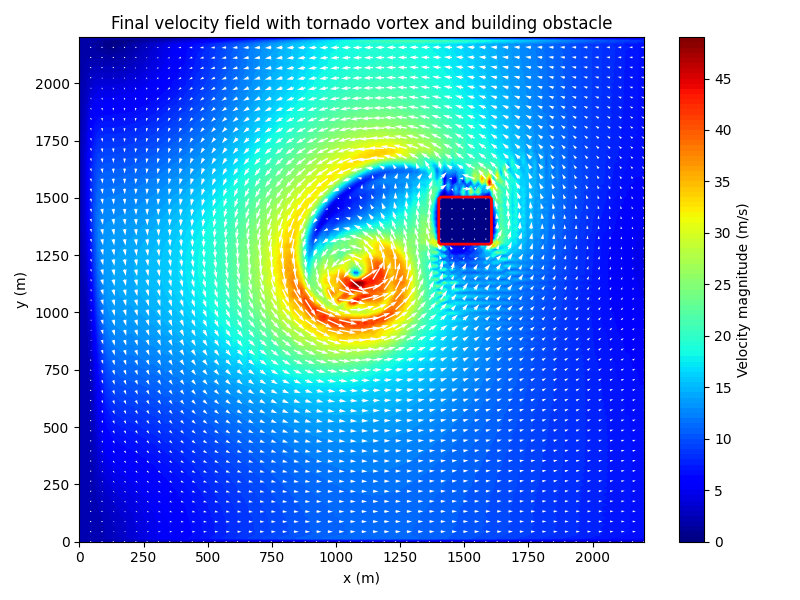

In [12]:
def plot_velocity_field(X, Y, u, v, vel_mag, building):
    """
    Plot the velocity field with velocity vectors and magnitude.

    Parameters:
    -----------
    X, Y : 2D arrays of floats
        Meshgrid for the x and y coordinates.
    u, v : 2D arrays of floats
        Velocity components in the x and y directions.
    vel_mag : 2D array of floats
        Magnitude of the velocity field.
    building : 2D boolean array
        Mask indicating the location of the building.

    Returns:
    --------
    None
    """
    # Create figure and axes
    plt.figure(figsize=(8, 6))

    # Plot velocity magnitude
    plt.contourf(X, Y, vel_mag, levels=100, cmap="jet")
    plt.colorbar(label="Velocity magnitude (m/s)")

    # Plot velocity vectors
    skip = (slice(None, None, 3), slice(None, None, 3))
    plt.quiver(X[skip], Y[skip], u[skip], v[skip], color="white")

    # Plot building
    plt.contour(X, Y, building, levels=[0.5], colors="red", linewidths=2)

    # Plot settings
    plt.axis([X.min(), X.max(), Y.min(), Y.max()])
    plt.xlabel("x (m)")
    plt.ylabel("y (m)")
    plt.title("Final velocity field with tornado vortex and building obstacle")

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.show()


# Plot the initial velocity field
plot_velocity_field(X, Y, u, v, velocity_magnitude, building)

In [13]:
def animate_velocity_field(X, Y, u_fields, v_fields, building, interval=80):
    """
    Create an animation of the velocity field over time.

    Parameters:
    -----------
    X, Y : 2D arrays of floats
        Meshgrid for the x and y coordinates.
    u_fields, v_fields : List of 2D arrays of floats
        List of velocity fields in the x and y directions.
    building : 2D boolean array
        Mask indicating the location of the building.
    interval : int (default: 100)
        Time interval between frames in milliseconds.

    Returns:
    --------
    anim : FuncAnimation object
        Matplotlib animation of the velocity field.
    """
    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(8, 8))

    def update_frame(i):
        """Update the animation."""
        # Compute the velocity magnitude for the current frame
        u = u_fields[i]
        v = v_fields[i]
        vel_mag = np.sqrt(u**2 + v**2)

        # Clear the previous contour plot
        ax.clear()

        # Update the contour plot and title
        ax.contourf(X, Y, vel_mag, levels=100, cmap="jet")
        ax.set_title(f"Velocity field at frame {i + 1}")

        # Plot the building
        ax.contour(X, Y, building, levels=[0.5], colors="red", linewidths=2)

        # Set plot limits and labels
        ax.axis([X.min(), X.max(), Y.min(), Y.max()])
        ax.set_xlabel("x (m)")
        ax.set_ylabel("y (m)")

    anim = animation.FuncAnimation(
        fig,
        update_frame,
        frames=len(u_fields),
        interval=interval,
        repeat=False,
        blit=False,
    )

    # Close the figure to prevent it from displaying twice
    plt.close(fig)

    return anim


# Reduce the number of frames for better performance
u_fields = u_hist[::30]
v_fields = v_hist[::30]

# Display the animation
ani = animate_velocity_field(X, Y, u_fields, v_fields, building)
display(HTML(ani.to_jshtml()))


#### 2. 3D surface plot of velocity magnitude

This function generates a three-dimensional surface plot of the velocity magnitude. The 3D plot maps the speed of the flow to a vertical dimension, allowing easy identification of regions with higher or lower velocity.

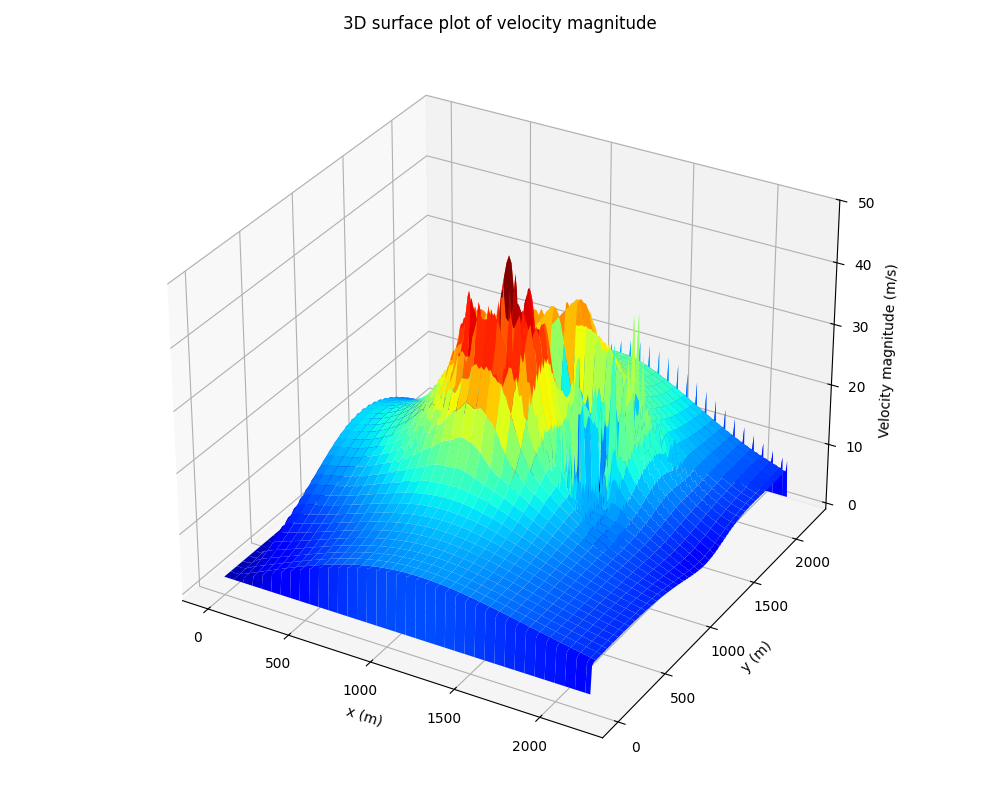

In [14]:
def plot_velocity_3d_surface(X, Y, vel_mag):
    """
    Generate a 3D surface plot of the velocity magnitude.

    Parameters
    ----------
    X : np.ndarray
        Meshgrid array of x-coordinates.
    Y : np.ndarray
        Meshgrid array of y-coordinates.
    vel_mag : np.ndarray
        The velocity magnitude field.

    Returns
    -------
    None
    """
    # Create figure and axes
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection="3d")

    # Plot the 3D surface of the pressure field
    ax.plot_surface(X, Y, vel_mag, cmap="jet", edgecolor="none")

    # Plot settings
    ax.set_xlabel("x (m)")
    ax.set_ylabel("y (m)")
    ax.set_zlabel("Velocity magnitude (m/s)")
    ax.set_title("3D surface plot of velocity magnitude")

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.show()


# Plot the 3D surface of the velocity magnitude
plot_velocity_3d_surface(X, Y, velocity_magnitude)

#### 3. Pressure field contours

This function generates a filled contour plot of the pressure field. The plot helps to identify regions of high and low pressure within the domain, providing insight into the pressure distribution.

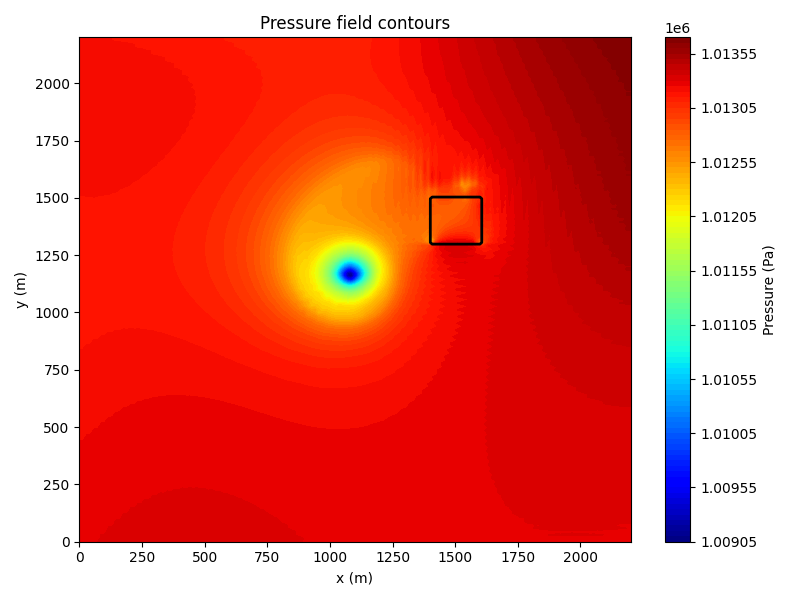

In [15]:
def plot_pressure_contours(X, Y, p):
    """
    Plot the pressure field using filled contours.

    Parameters
    ----------
    X : np.ndarray
        Meshgrid array of x-coordinates.
    Y : np.ndarray
        Meshgrid array of y-coordinates.
    p : np.ndarray
        The pressure field.

    Returns
    -------
    None
    """
    # Create figure and axes
    plt.figure(figsize=(8, 6))

    # Plot vorticity contours
    plt.contourf(X, Y, p, levels=100, cmap="jet")
    plt.colorbar(label="Pressure (Pa)")

    # Plot building
    plt.contour(X, Y, building, levels=[0.5], colors="black", linewidths=2)

    # Plot settings
    plt.axis([X.min(), X.max(), Y.min(), Y.max()])
    plt.xlabel("x (m)")
    plt.ylabel("y (m)")
    plt.title("Pressure field contours")

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.show()


# Plot the pressure field
plot_pressure_contours(X, Y, p)

#### 4. 3D surface plot of pressure

This function produces a three-dimensional surface plot of the pressure field. By mapping pressure values to a vertical dimension, the plot offers a topographical view of the pressure distribution.

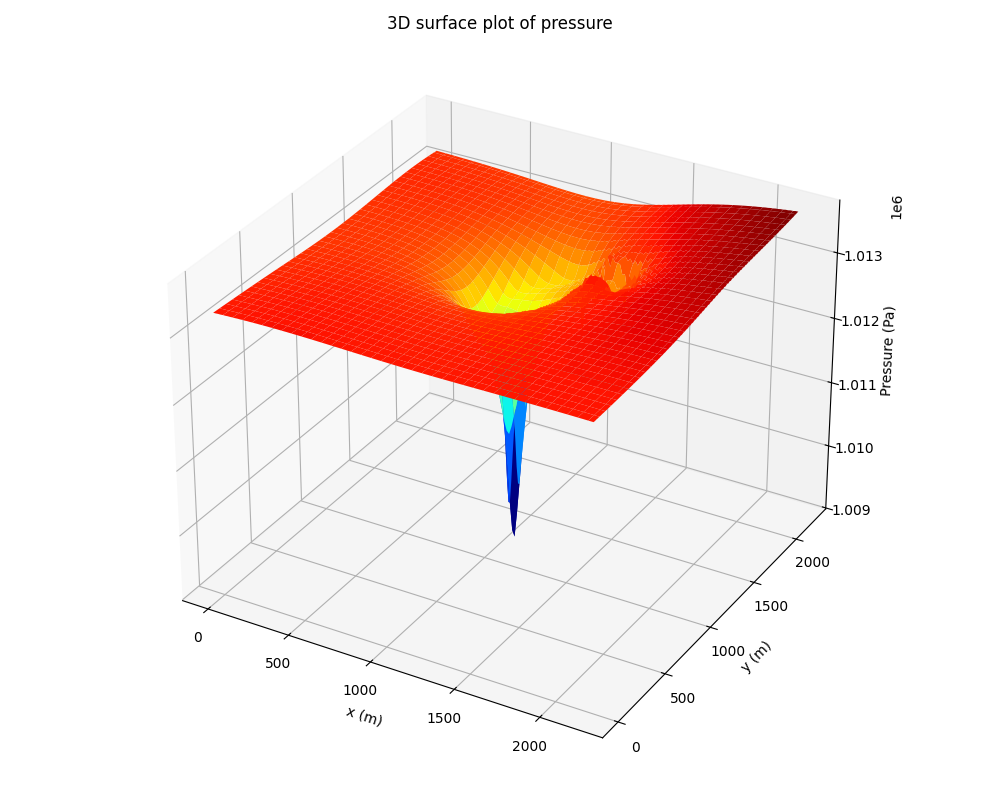

In [16]:
def plot_pressure_3d_surface(X, Y, p):
    """
    Generate a 3D surface plot of the pressure field.

    Parameters
    ----------
    X : np.ndarray
        Meshgrid array of x-coordinates.
    Y : np.ndarray
        Meshgrid array of y-coordinates.
    p : np.ndarray
        The pressure field.

    Returns
    -------
    None
    """
    # Create figure and axes
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection="3d")

    # Plot the 3D surface of the pressure field
    ax.plot_surface(X, Y, p, cmap="jet", edgecolor="none")

    # Plot settings
    ax.set_xlabel("x (m)")
    ax.set_ylabel("y (m)")
    ax.set_zlabel("Pressure (Pa)")
    ax.set_title("3D surface plot of pressure")

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.show()


# Plot the 3D surface of the pressure field
plot_pressure_3d_surface(X, Y, p)

#### 5. Streamline plot

This function produces a streamline plot that visualizes the overall flow pattern by drawing curves tangent to the velocity field. The color along the streamlines represents the local velocity magnitude, providing additional insight into flow speed variations.

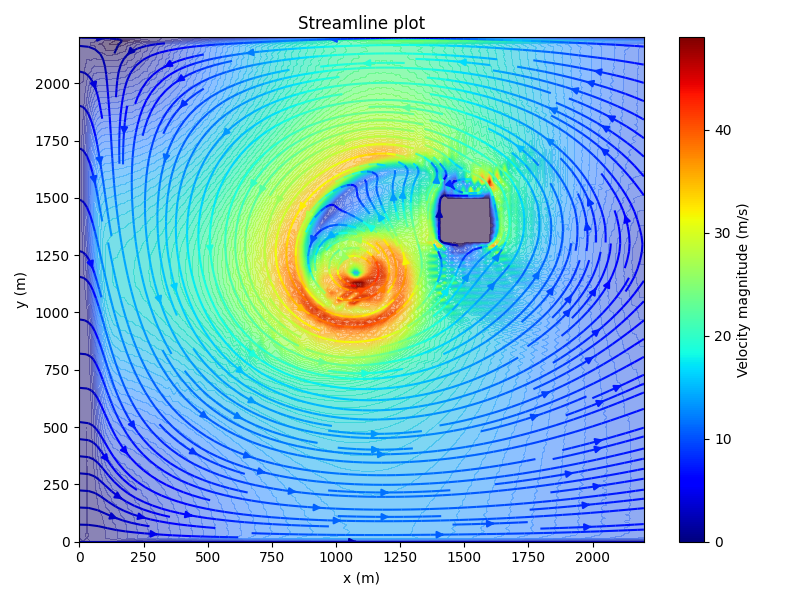

In [17]:
def plot_streamlines(X, Y, u, v, vel_mag):
    """
    Plot streamlines of the velocity field.

    Parameters
    ----------
    X : np.ndarray
        Meshgrid array of x-coordinates.
    Y : np.ndarray
        Meshgrid array of y-coordinates.
    u : np.ndarray
        x-component of the velocity field.
    v : np.ndarray
        y-component of the velocity field.
    vel_mag : np.ndarray
        The velocity magnitude field.

    Returns
    -------
    None
    """
    # Create figure and axes
    plt.figure(figsize=(8, 6))

    # Plot streamlines of the velocity field
    plt.contourf(X, Y, vel_mag, levels=100, cmap="turbo", alpha=0.6)

    # Overlay: streamlines colored by velocity magnitude
    strm = plt.streamplot(X, Y, u, v, density=2, cmap="jet", color=vel_mag)
    plt.colorbar(strm.lines, label="Velocity magnitude (m/s)")

    # Plot settings
    plt.axis([X.min(), X.max(), Y.min(), Y.max()])
    plt.xlabel("x (m)")
    plt.ylabel("y (m)")
    plt.title("Streamline plot")

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.show()


# Plot streamlines of the velocity field
plot_streamlines(X, Y, u, v, velocity_magnitude)